In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
from tqdm.autonotebook import tqdm, trange
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})


from modules.time_discretization import TimeDiscretization
from modules.simulator import ElectricityPriceMultiFactorSimulator
from modules.demand import ConstantDemandModel
from modules.battery_model import BatteryModel
from modules.environment import BatteryProblem
from modules import solver, visualize
from modules.utils import *

C:\Users\John\AppData\Local\Temp\ipykernel_6768\3532519726.py:6: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


## Simulator

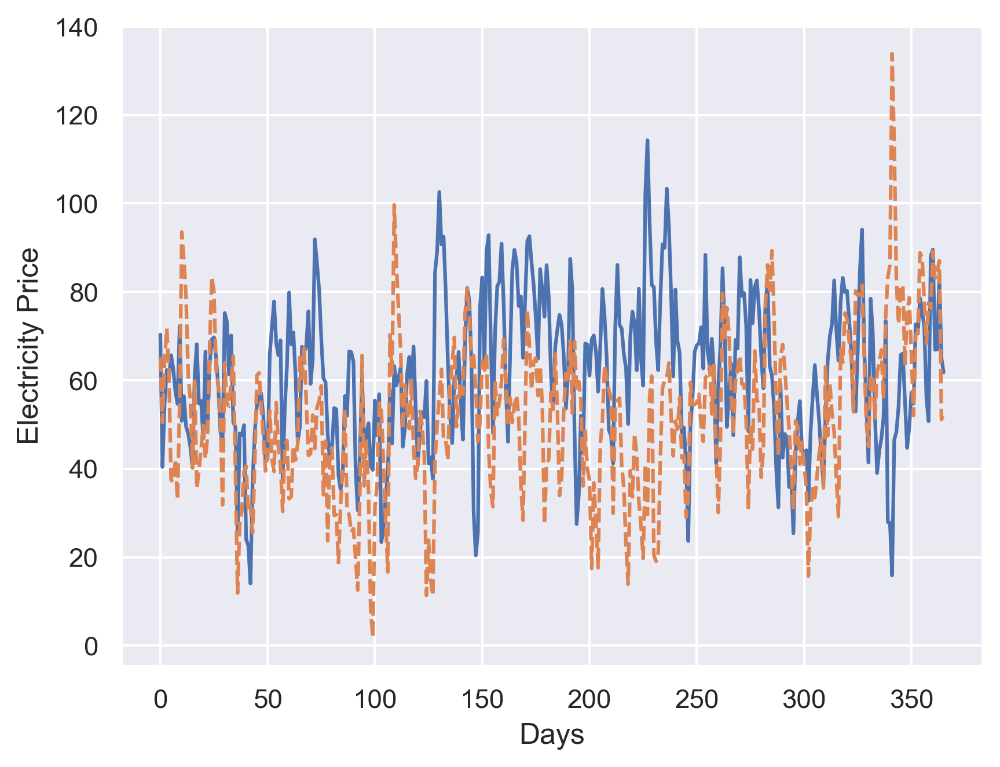

(3.0798027174360376, 5.699951636325252)

In [70]:
days = 365
freq = 'd'
n_samples = 2*10**0

td = TimeDiscretization(T=days, n_steps=None, unit='d', freq=freq)
sim = ElectricityPriceMultiFactorSimulator(seasonal_impact_factor=1, long_term_impact_factor=1, short_term_impact_factor=1, wind_impact_factor=1.0)
sample_paths = sim.simulate(td, n_samples=n_samples)
price = sample_paths[:, 0, :].T
# wind = sample_paths[0, 1, :].T
# forecast = sample_paths[0, 2, :].T
df = pd.DataFrame(price, index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$S^{{({i})}}$' for i in range(1, n_samples+1)])
ax = sns.lineplot(df)
ax.set(xlabel='Days', ylabel='Electricity Price')
ax.get_legend().remove()
# sns.lineplot(-0.116 + wind * (-74.7), label='wind')
# sns.lineplot(-0.116 + forecast * (-74.7), label='forecast')
plt.show()

price = price - 52.45102562412512
# compute confidence interval for mean price
price.mean() - 1.96 * price.std() / np.sqrt(len(price.flatten())), price.mean() + 1.96 * price.std() / np.sqrt(len(price.flatten()))

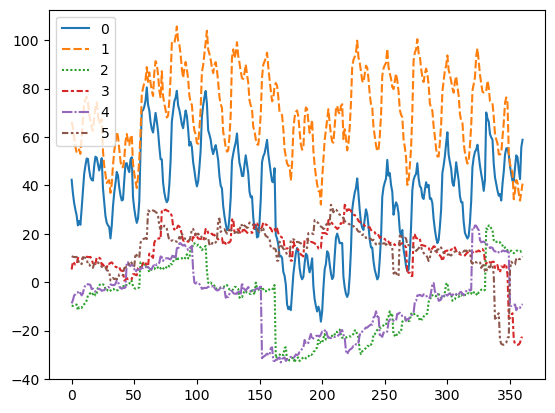

In [30]:
days = 15
freq = 'h'
n_samples = 2*10**0

td = TimeDiscretization(T=days, n_steps=None, unit='d', freq=freq)
sim = ElectricityPriceMultiFactorSimulator(seasonal_impact_factor=1, long_term_impact_factor=1, short_term_impact_factor=1, wind_impact_factor=1.0, K_f=24)
sample_paths = sim.simulate(td, n_samples=n_samples)
price = sample_paths[:, 0, :].T
wind = sample_paths[:, 1, :].T
forecast = sample_paths[:, 12, :].T
df_price = pd.DataFrame(price, index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$S^{{({i})}}$' for i in range(1, n_samples+1)])
# ax = sns.lineplot(df_price)
# ax.set(xlabel='days', ylabel='price')
# ax.get_legend().remove()
df_wind = pd.DataFrame(wind * (-74.7), index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$W^{{({i})}}$' for i in range(1, n_samples+1)])
# sns.lineplot(df_wind)
df_forecast = pd.DataFrame(forecast* (-74.7), index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$F^{{({i})}}$' for i in range(1, n_samples+1)])
# sns.lineplot(df_forecast)

df = pd.DataFrame(np.concatenate([df_price, df_wind, df_forecast], axis=1))
sns.lineplot(df)
plt.show()

0.14266907101229212


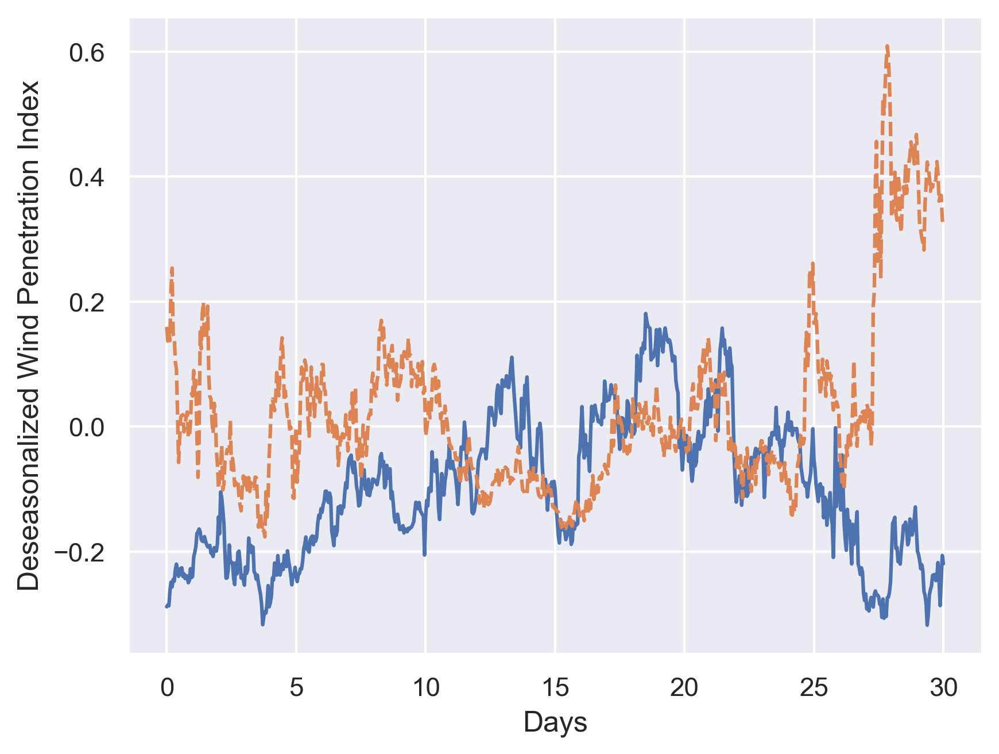

0.16992173746509048


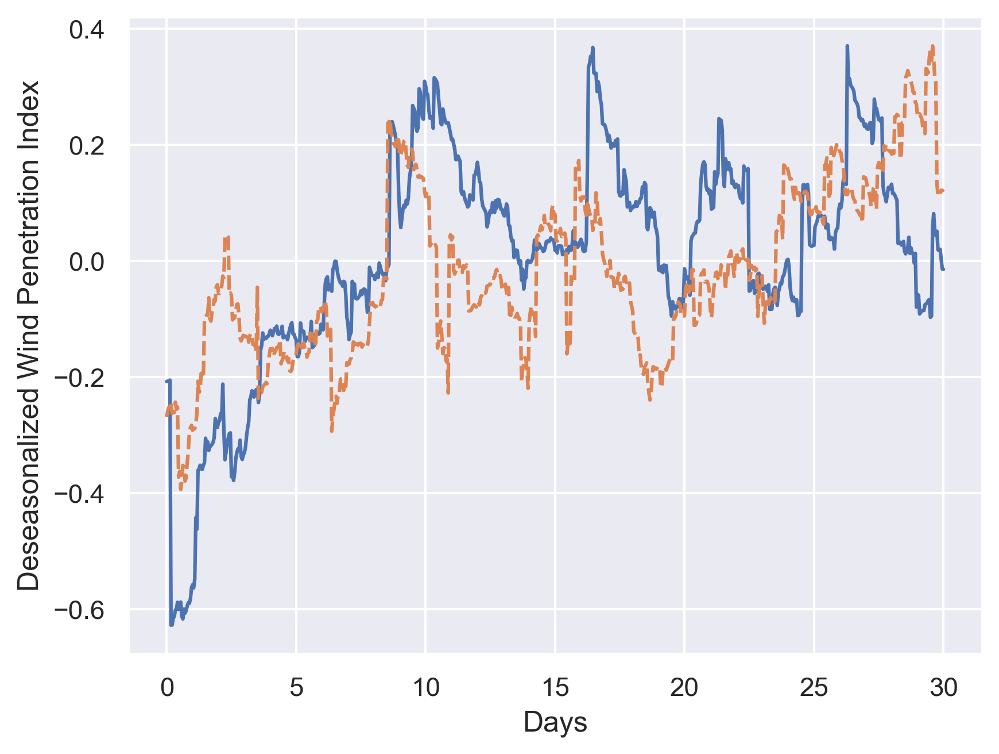

In [48]:
from modules.simulator import WindPenetrationIndexBSS, WindPenetrationIndexNIG

days = 30
freq = 'h'
n_samples = 2*10**0

td = TimeDiscretization(T=days, n_steps=None, unit='d', freq=freq)
sim = WindPenetrationIndexBSS()
sample_paths = sim.simulate(td, n_samples=n_samples)
wind = sample_paths[:, 0, :].T
print(wind.std())
df_windBSS = pd.DataFrame(wind, index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$BSS^{{({i})}}$' for i in range(1, n_samples+1)])
ax = sns.lineplot(df_windBSS)
ax.set(xlabel='Days', ylabel='Deseasonalized Wind Penetration Index')
ax.legend().remove()
plt.show()

sim = WindPenetrationIndexNIG(reversion_rate=0.013509848425914805,a=0.831151507599864, b=-0.050690482837973345, loc=0.0021776979127245263, scale=0.15217561629721574, unit='h')
sample_paths = sim.simulate(td, n_samples=n_samples)
wind = sample_paths[:, 0, :].T
print(wind.std())
df_windNIG = pd.DataFrame(wind, index=np.linspace(start=0, stop=days, num=td.n_steps+1), columns=[f'$W^{{({i})}}$' for i in range(1, n_samples+1)], )
ax = sns.lineplot(df_windNIG)
ax.set(xlabel='Days', ylabel='Deseasonalized Wind Penetration Index')
ax.legend().remove()
plt.show()

# df = pd.concat([df_windBSS, df_windNIG], axis=1)
# ax = sns.lineplot(df)
# ax.set(xlabel='Days', ylabel='Deseasonalized Wind Penetration Index')
# plt.show()

## Environment

[[[0.68864854]
  [0.53825983]
  [0.2829754 ]]]


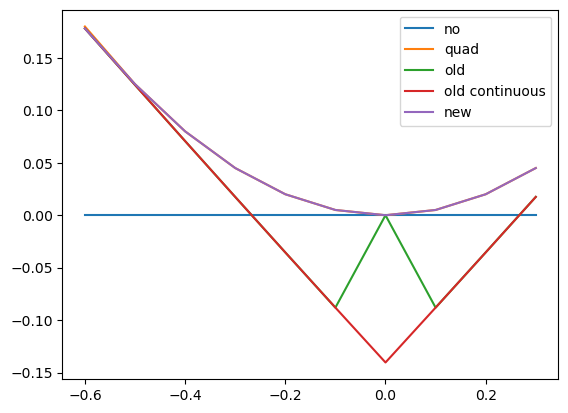

In [ ]:
time_discretization = TimeDiscretization(T=7, n_steps=7*24, unit='d')

step = 7*24-1
step = np.random.randint(0, time_discretization.n_steps) 
control = np.random.random(size=(1, 3, 1))
print(control)
# control = np.array([0.9, 1, 1]).reshape(1, 3, 1)

for degradation_model in ['no', 'quad', 'old', 'old continuous', 'new']:
    battery = BatteryModel(K_y=10, K_Cav=4, K_Tac=4, Q_max=10, C_max=1.0, ageing_cost=10**-4, battery_value=10000, degradation_model=degradation_model)
    demand = ConstantDemandModel(demand=0.5, unit='h')
    env = BatteryProblem(time_discretization=time_discretization, battery=battery, demand=demand)
    action = env.get_admissible_actions(step=step, control=control)

    degradation_cost = battery.compute_degradation_cost(step=step, control=control, action=action)
    sns.lineplot(x=action.squeeze(), y=degradation_cost[0, 0, :].T, label=degradation_model)
plt.show()

In [ ]:
time_discretization = TimeDiscretization(T=7, n_steps=7*24, unit='d')

step = 7*24-1
# step = np.random.randint(0, time_discretization.n_steps) 
# control = np.random.random(size=(1, 3, 1))
# print(control)
control = np.array([0.9, 0.5, 0.25]).reshape(1, 3, 1)

battery = BatteryModel(K_y=10, K_Cav=4, K_Tac=4, Q_max=10, C_max=1.0, ageing_cost=10**-4, battery_value=10000, degradation_model='old continuous')
demand = ConstantDemandModel(demand=0.5, unit='h')
env = BatteryProblem(time_discretization=time_discretization, battery=battery, demand=demand)
interpolation_controls, interpolation_coeffs = battery.get_interpolation_controls(control=control)
print(interpolation_controls)
print(interpolation_coeffs)
print((interpolation_controls * interpolation_coeffs).sum(axis=-1))

[[[[0.9  0.9  0.9  0.9 ]]

  [[0.5  0.5  0.25 0.25]]

  [[0.25 0.   0.25 0.  ]]]]
[[[[ 1. -0. -0.  0.]]]]
[[[0.9 ]
  [0.5 ]
  [0.25]]]


## Battery Problem

### Time granularity effect

In [2]:
experiment = 'time_granularity'
path = f'experiments/{experiment}/saved_solvers'
config_file = f'experiments/{experiment}/parameters.yaml'

# if True, only load saved solver
load = True  # edit this
# else, solve for parmaters given by config or dict
load_parameters_from_config = True # edit this
save = False  # edit this

# ----- create parameters ----- #
if load_parameters_from_config:
    with open(config_file, 'r') as file:
        config = yaml.safe_load(file)
        base_parameter = config['base_parameter']  # base parameter for the problem
        parameter_changes = config['parameter_changes']  # parameter changes for the problem
else:
    pass
    # parameter_changes =   # edit this
parameters = solver.create_parameters(base_parameter, parameter_changes)

# ----- start of computations ----- #
if load:  # load solvers from folder
    solvers = solver.load_solvers(path=path)
else:  # solve with parameters
    solvers = solver.solve_with_parameters(parameters, save=save, path=path)

  0%|          | 0/7 [00:00<?, ?it/s]

----- found time granularity 12h; loading -----
----- found time granularity 1h; loading -----
----- found time granularity 24h; loading -----
----- found time granularity 2h; loading -----
----- found time granularity 4h; loading -----
----- found time granularity 6h; loading -----
----- found time granularity 8h; loading -----
solvers loaded


----- time granularity 12h -----


  0%|          | 0/60 [00:00<?, ?it/s]

{'lower bound estimate': 11.897800113740253, '95% confidence interval': [11.790527611586274, 12.005072615894232], 'v_0': 'value function not approximated'}
----- time granularity 1h -----


  0%|          | 0/720 [00:00<?, ?it/s]

{'lower bound estimate': 1.3022685792862052, '95% confidence interval': [1.1956145451644715, 1.408922613407939], 'v_0': 'value function not approximated'}
----- time granularity 24h -----


  0%|          | 0/30 [00:00<?, ?it/s]

{'lower bound estimate': 15.007433986005378, '95% confidence interval': [14.898082256995757, 15.116785715014998], 'v_0': 'value function not approximated'}
----- time granularity 2h -----


  0%|          | 0/360 [00:00<?, ?it/s]

{'lower bound estimate': 3.3027959274239675, '95% confidence interval': [3.1951829702452508, 3.4104088846026843], 'v_0': 'value function not approximated'}
----- time granularity 4h -----


  0%|          | 0/180 [00:00<?, ?it/s]

{'lower bound estimate': 7.152500346457939, '95% confidence interval': [7.042116329602716, 7.2628843633131615], 'v_0': 'value function not approximated'}
----- time granularity 6h -----


  0%|          | 0/120 [00:00<?, ?it/s]

{'lower bound estimate': 8.875127226835438, '95% confidence interval': [8.766083096884385, 8.984171356786492], 'v_0': 'value function not approximated'}
----- time granularity 8h -----


  0%|          | 0/90 [00:00<?, ?it/s]

{'lower bound estimate': 8.801388246629314, '95% confidence interval': [8.688817804213414, 8.913958689045213], 'v_0': 'value function not approximated'}
----- benchmark no battery -----
{'lower bound estimate': 15.78449524610958, '95% confidence interval': [15.675291282698351, 15.89369920952081]}


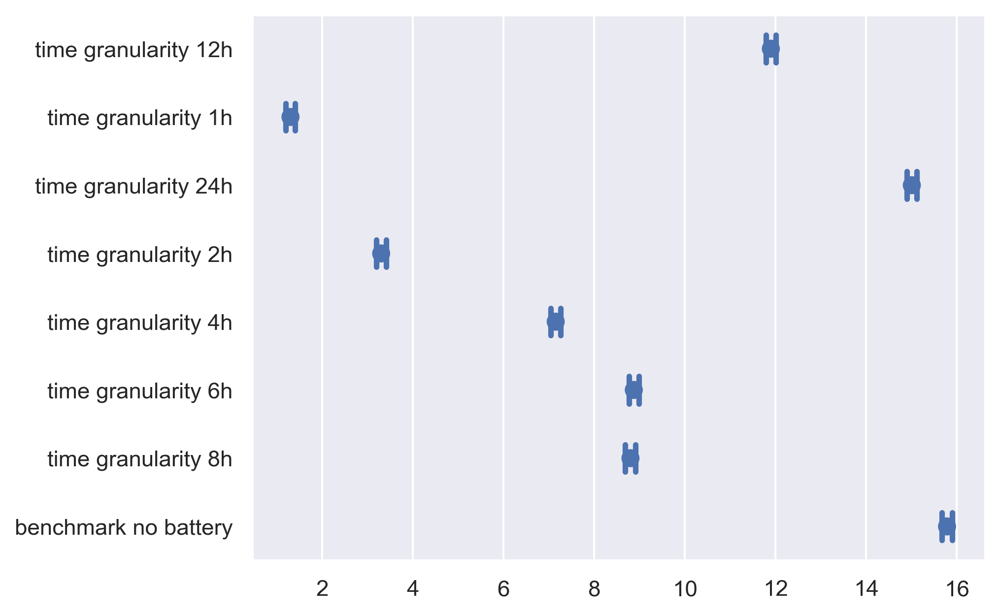

In [3]:
n_samples_test = 10**3  # number of samples for testing
initial_control = (0.0, 0.0, 0.0)  # initial control for lower bound

lower_bounds, cash_flows = solver.compute_lower_bound(solvers, 
                                                      initial_control=initial_control,
                                                      n_samples=n_samples_test, 
                                                      return_cash_flows=True)

fig = visualize.plot_confidence_intervals(cash_flows=cash_flows)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/720 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/360 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

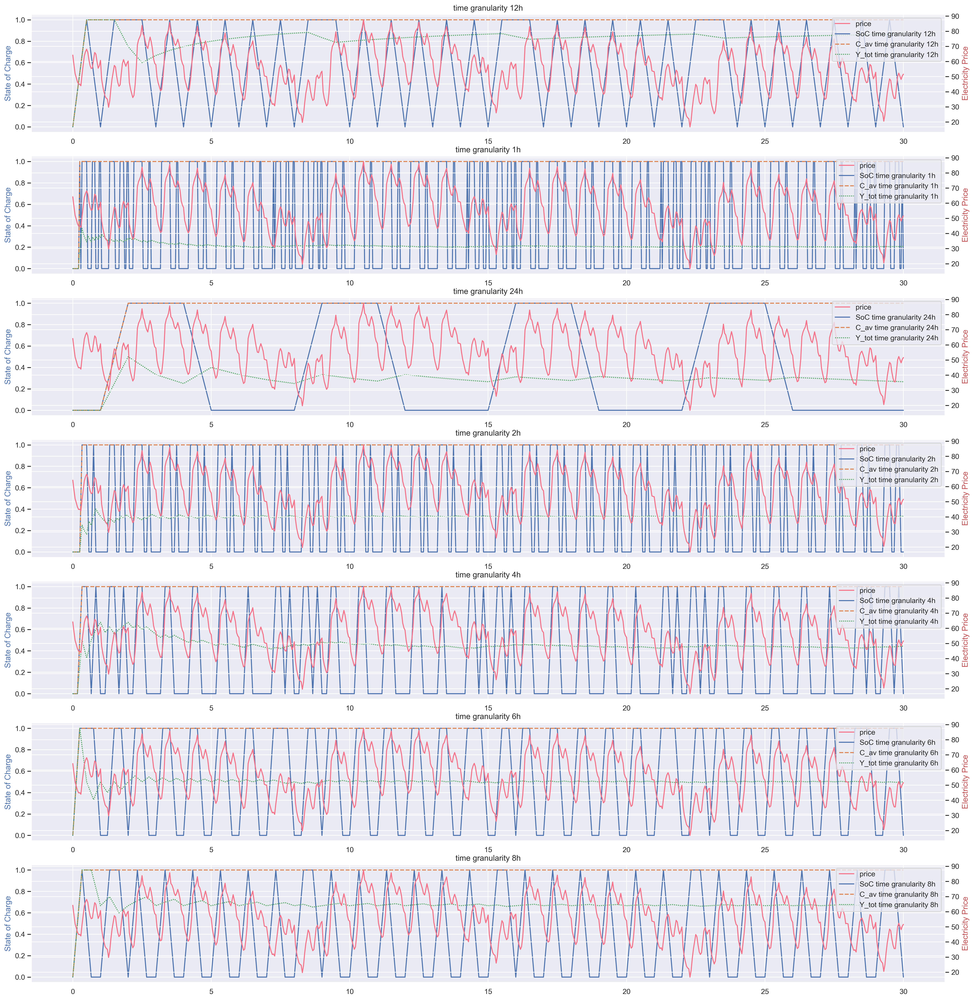

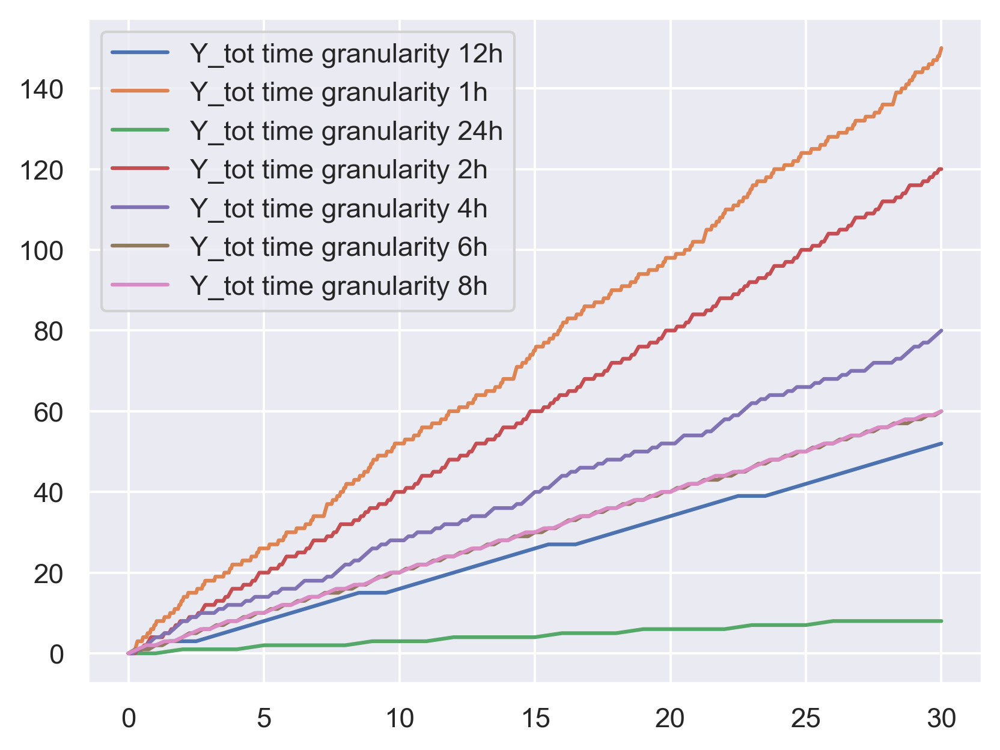

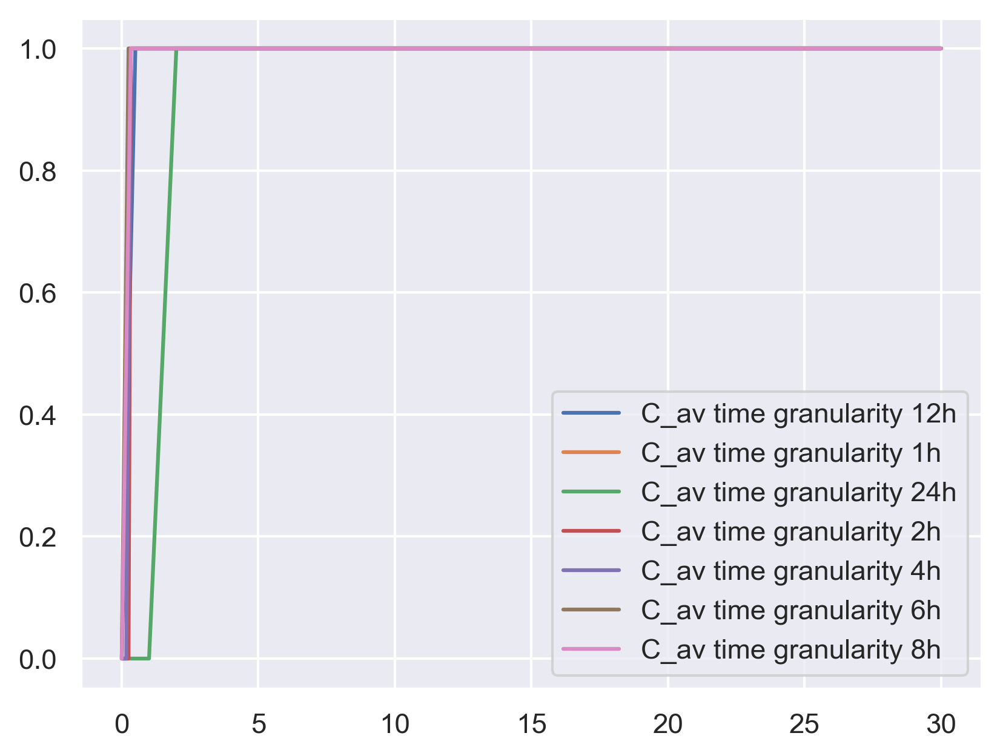

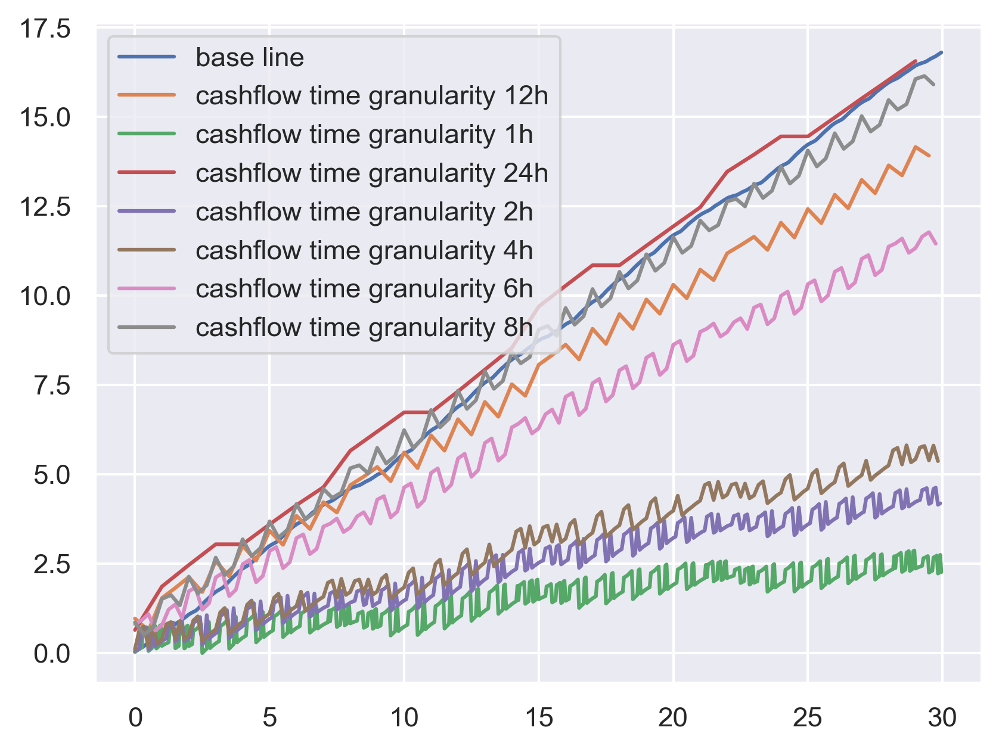

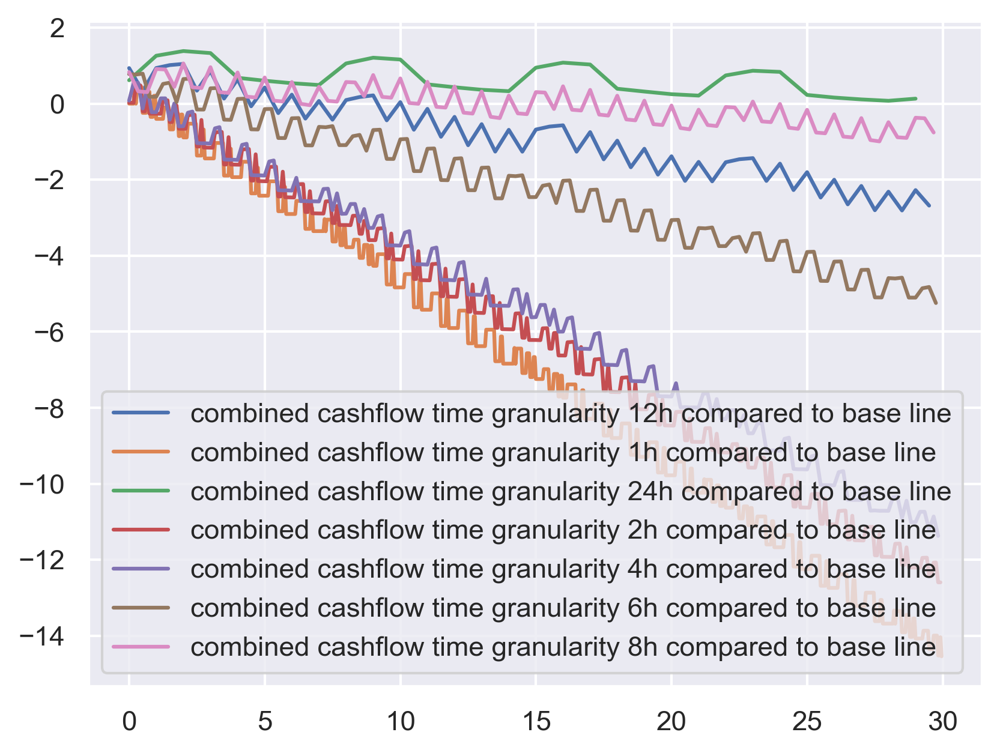

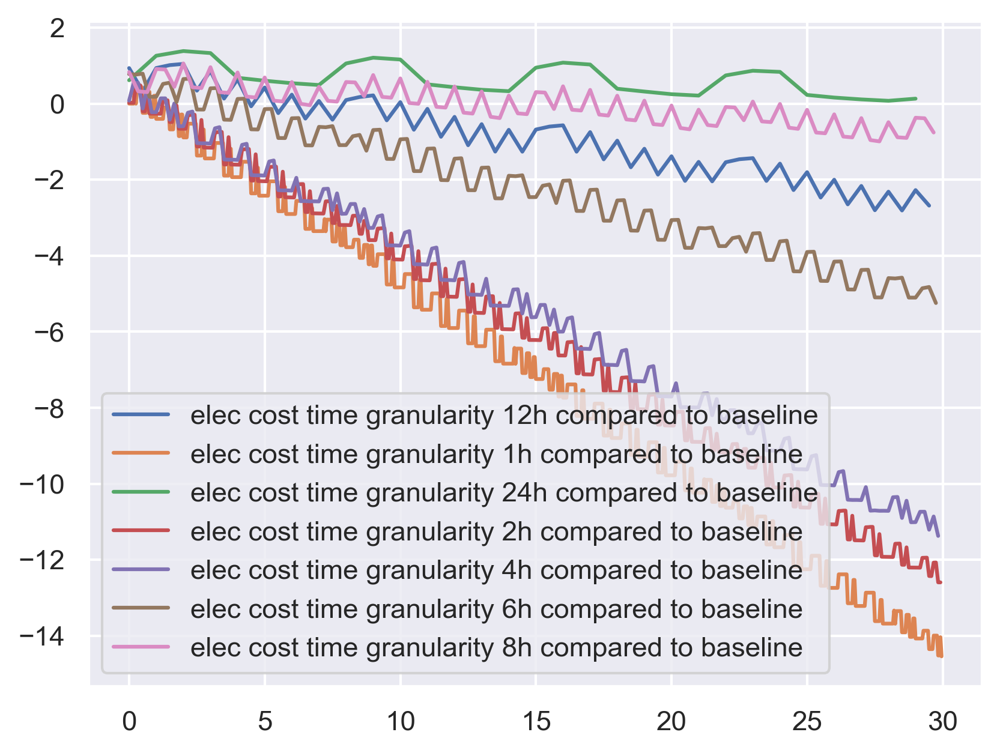

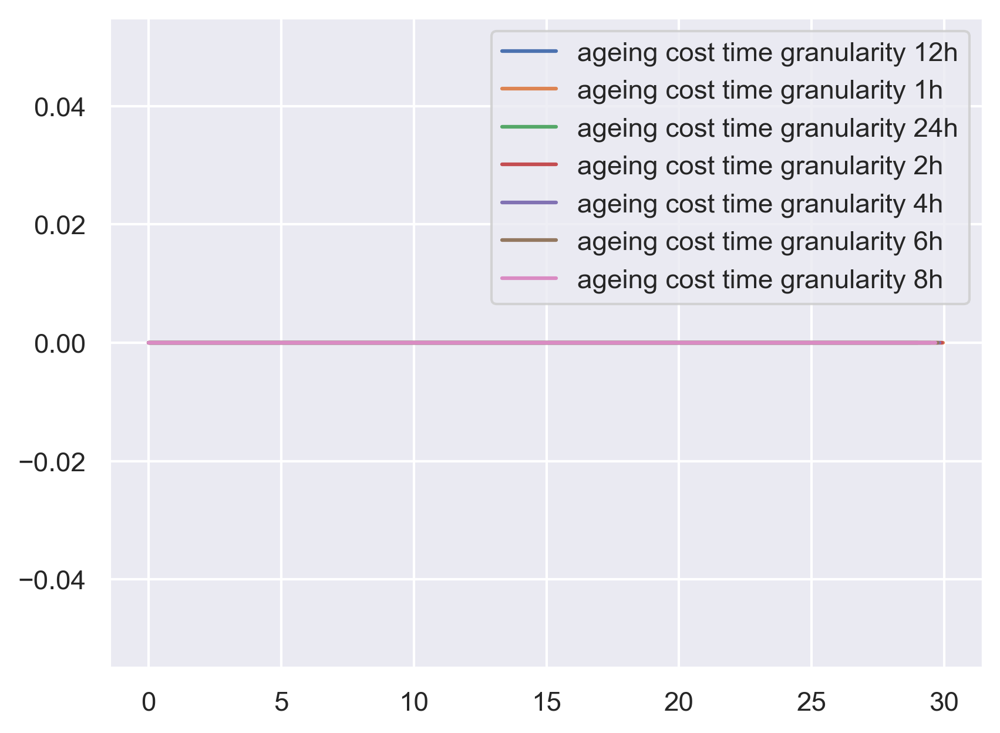

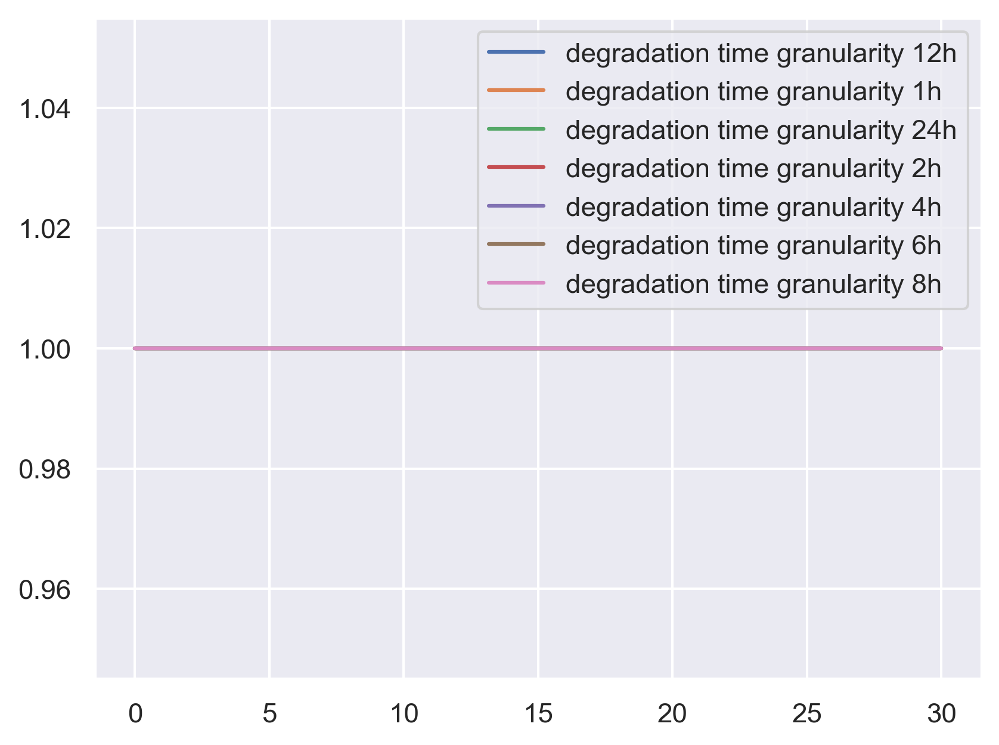

In [4]:
initial_control = (0.0, 0.0, 0.0)  # edit this

visualize.visualize_sample(solvers, initial_control=initial_control)

### Degradation effect

In [6]:
experiment = 'degradation_model_comparison'  # edit this
path = f'experiments/{experiment}/saved_solvers'
config_file = f'experiments/{experiment}/parameters.yaml'

# if True, only load saved solver
load = True  # edit this
# else, solve for parmaters given by config or dict
load_parameters_from_config = True # edit this
save = True  # edit this

# ----- create parameters ----- #
if load_parameters_from_config:
    with open(config_file, 'r') as file:
        config = yaml.safe_load(file)
        base_parameter = config['base_parameter']  # base parameter for the problem
        parameter_changes = config['parameter_changes']  # parameter changes for the problem
else:
    pass
    # parameter_changes =   # edit this
parameters = solver.create_parameters(base_parameter, parameter_changes)

# ----- start of computations ----- #
if load:  # load solvers from folder
    solvers = solver.load_solvers(path=path)
else:  # solve with parameters
    solvers = solver.solve_with_parameters(parameters, save=save, path=path)

  0%|          | 0/3 [00:00<?, ?it/s]

----- found degradation model (0); loading -----
----- found degradation model (A2); loading -----
----- found degradation model (B); loading -----
solvers loaded


----- degradation model (0) -----


  0%|          | 0/336 [00:00<?, ?it/s]

{'lower bound estimate': 0.6922938918839685, '95% confidence interval': [0.6401502339697847, 0.7444375497981524], 'v_0': 'value function not approximated'}
----- degradation model (A2) -----


  0%|          | 0/336 [00:00<?, ?it/s]

{'lower bound estimate': 4.451025970050934, '95% confidence interval': [4.396881120906229, 4.50517081919564], 'v_0': 'value function not approximated'}
----- degradation model (B) -----


  0%|          | 0/336 [00:00<?, ?it/s]

{'lower bound estimate': 5.225605990651962, '95% confidence interval': [5.171530347692796, 5.279681633611128], 'v_0': 'value function not approximated'}
----- benchmark no battery -----
{'lower bound estimate': 7.566086369507234, '95% confidence interval': [7.512685980958352, 7.619486758056116]}


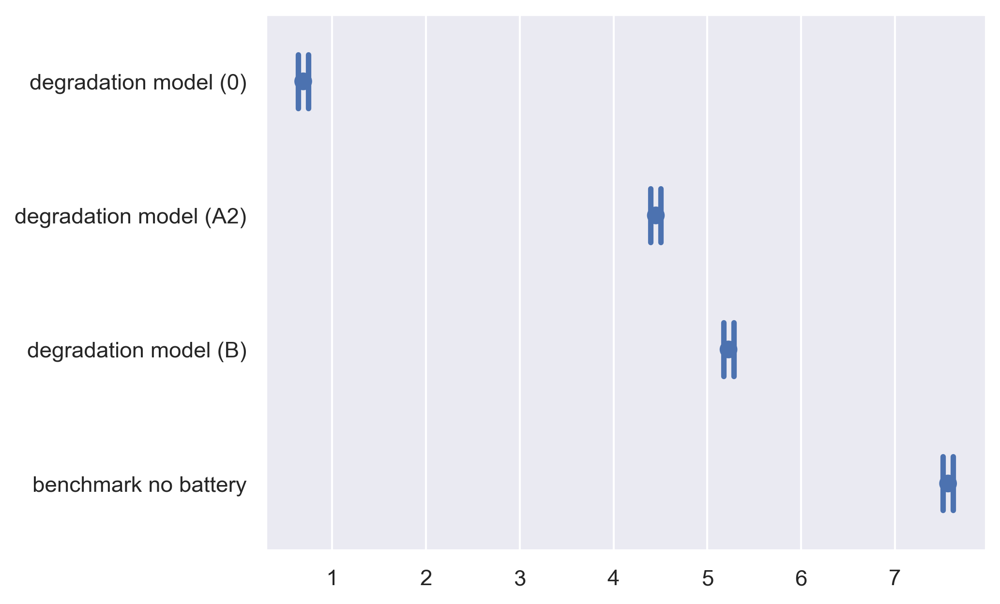

In [7]:
n_samples_test = 10**3  # number of samples for testing
initial_control = (0.0, 0.0, 0.0)  # initial control for lower bound

lower_bounds, cash_flows = solver.compute_lower_bound(solvers, 
                                                      initial_control=initial_control,
                                                      n_samples=n_samples_test, 
                                                      return_cash_flows=True)

fig = visualize.plot_confidence_intervals(cash_flows=cash_flows)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/336 [00:00<?, ?it/s]

  0%|          | 0/336 [00:00<?, ?it/s]

  0%|          | 0/336 [00:00<?, ?it/s]

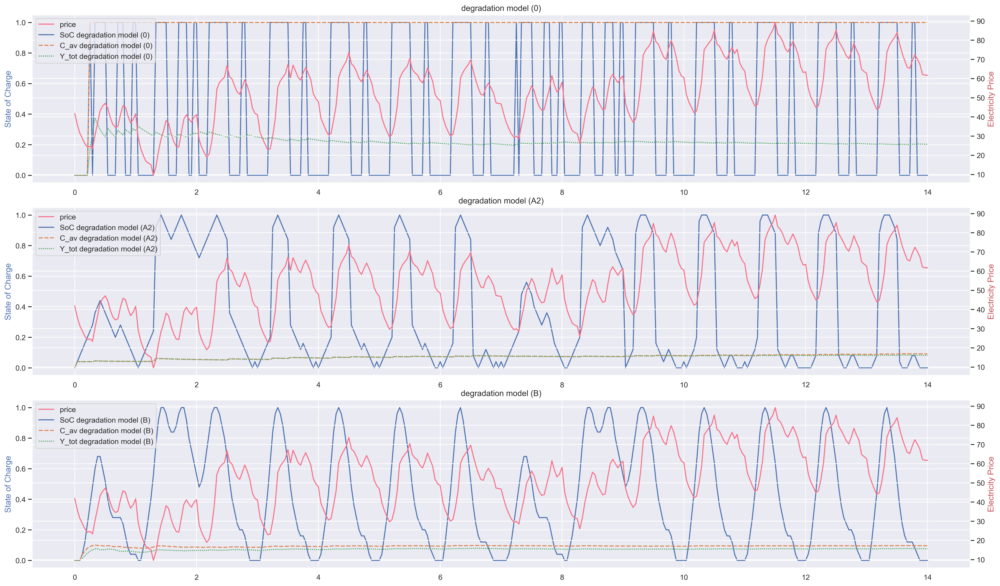

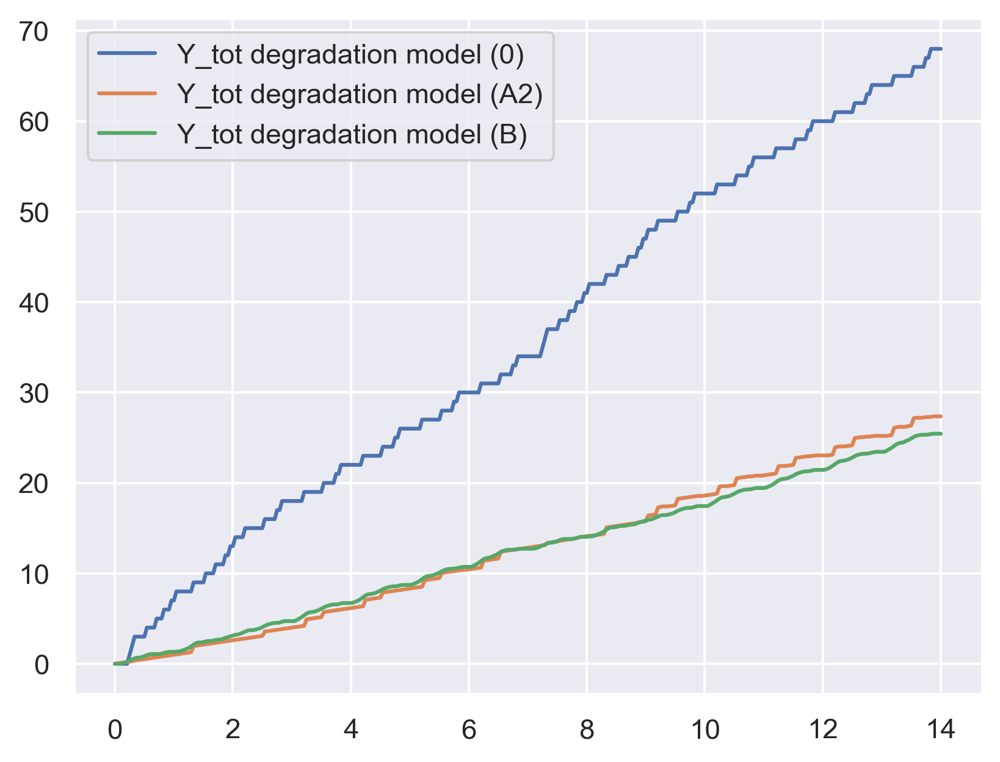

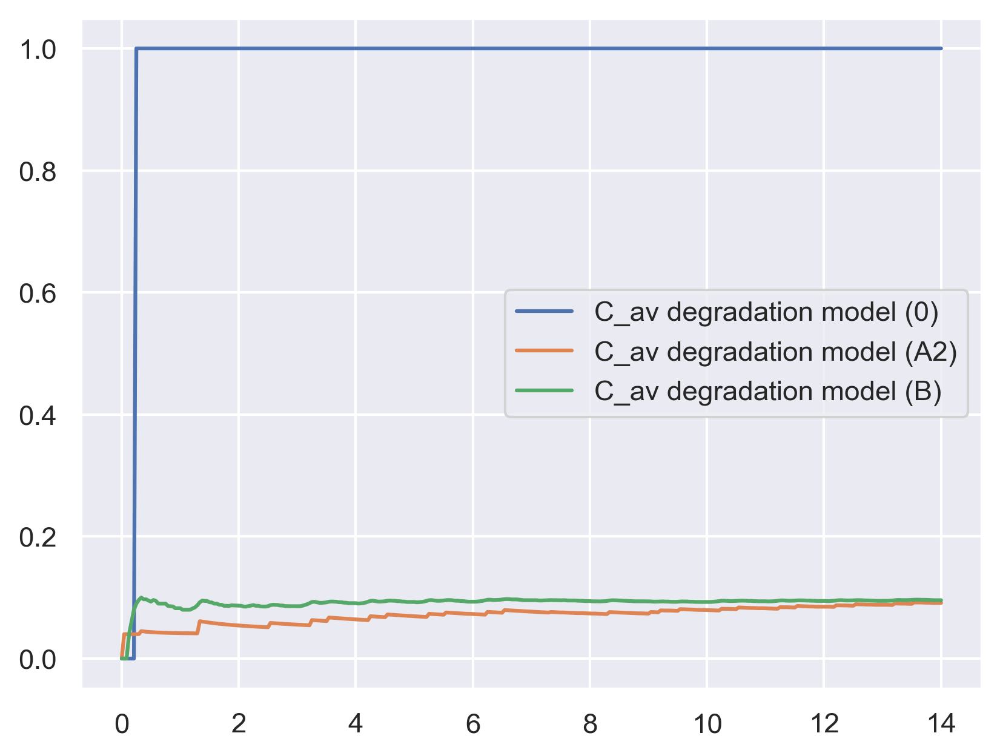

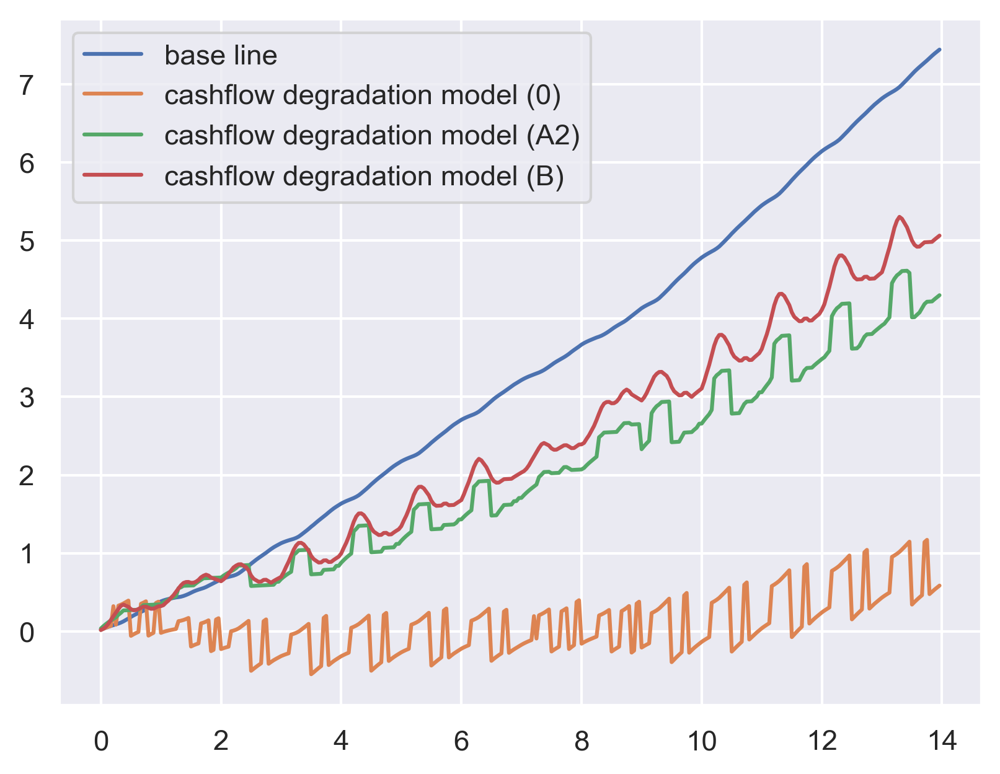

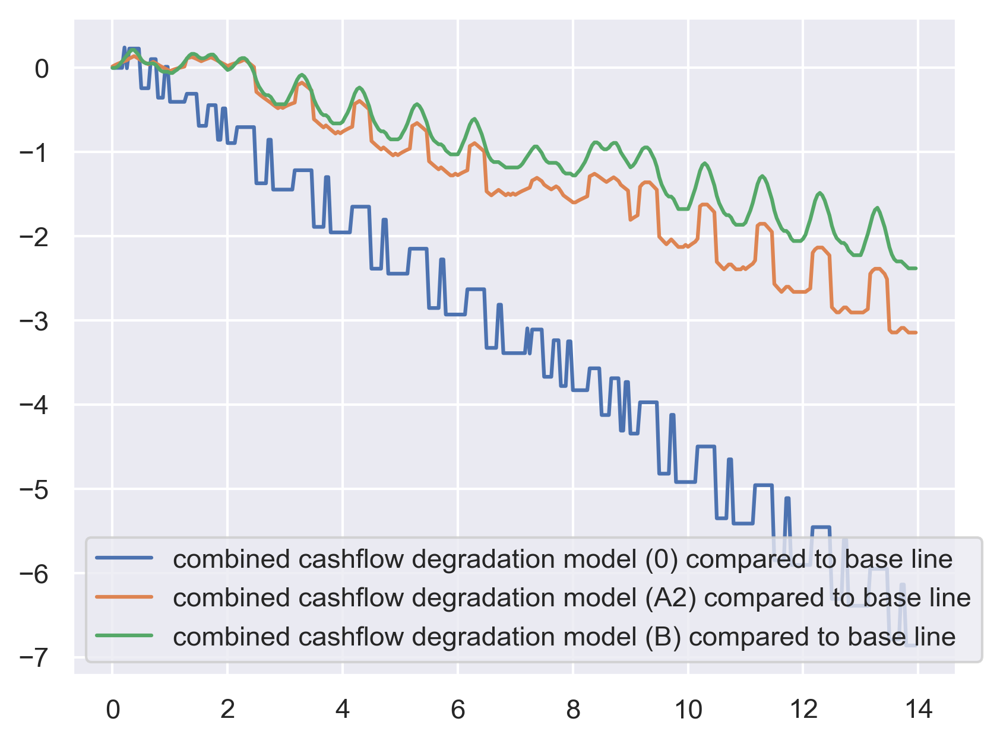

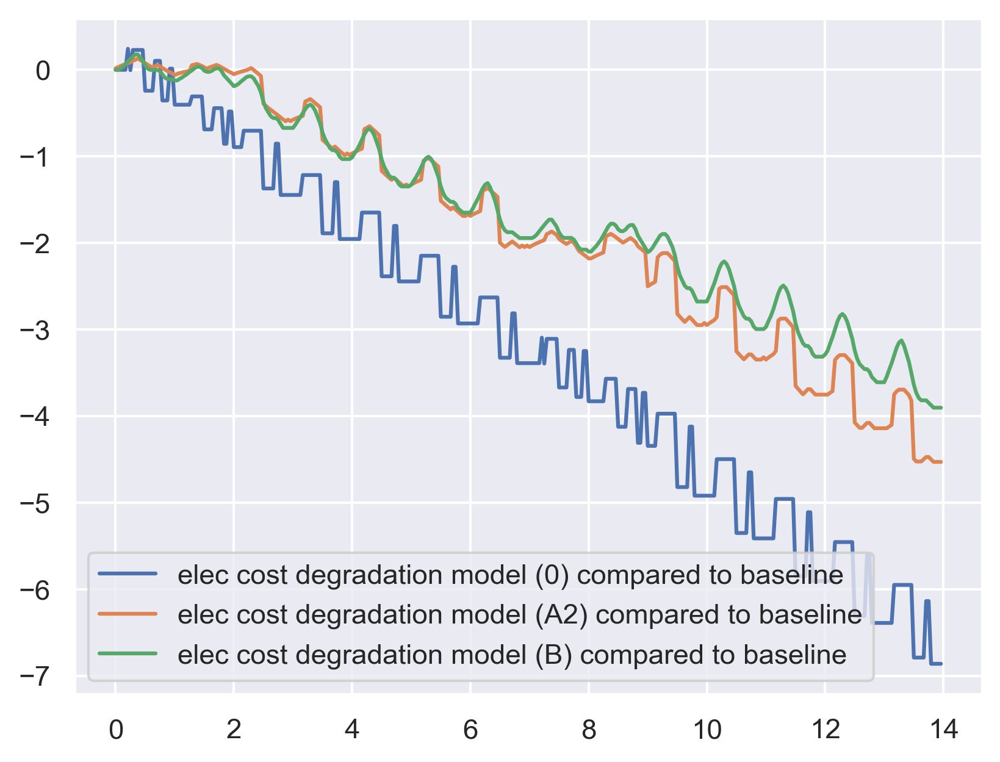

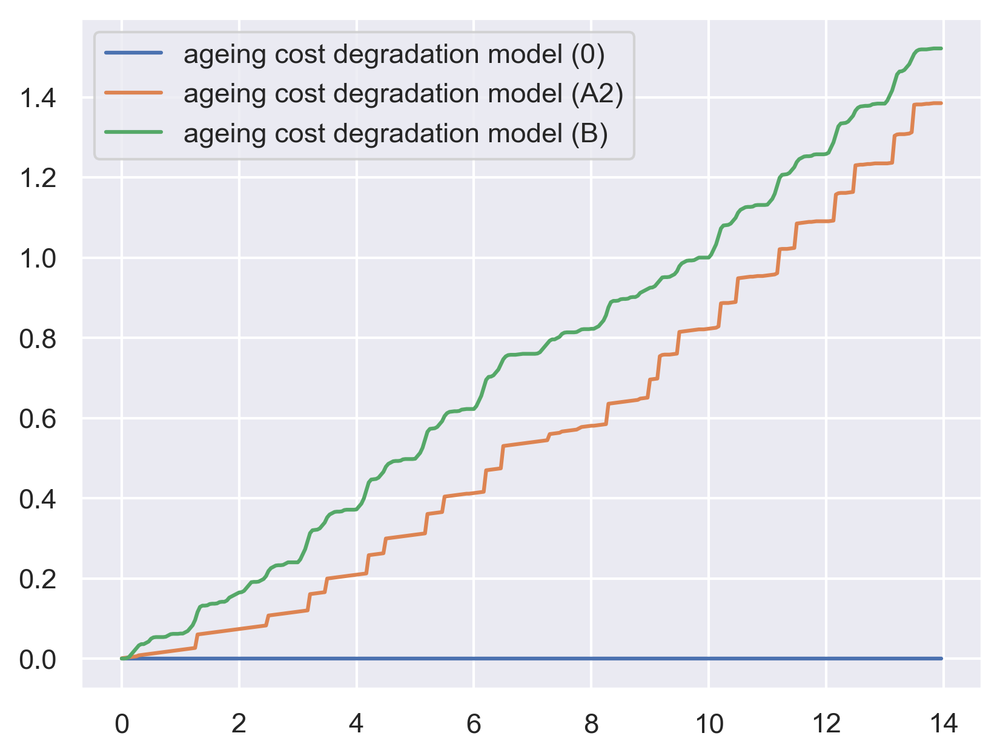

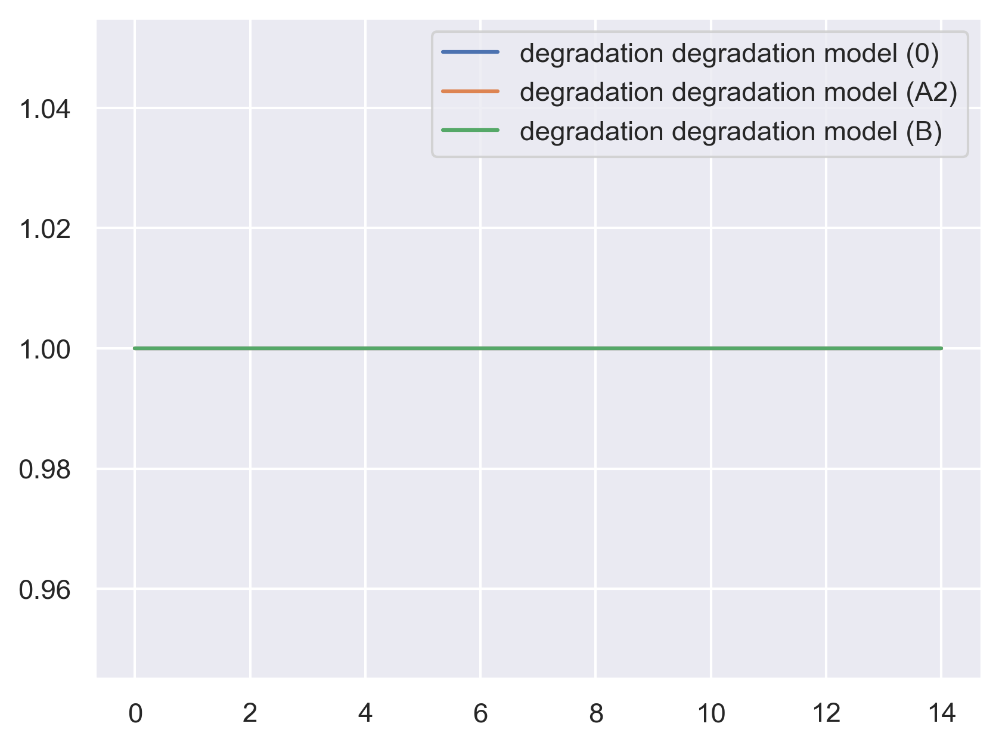

In [8]:
initial_control = (0.0, 0.0, 0.0)  # edit this

visualize.visualize_sample(solvers, initial_control=initial_control)

### Demand Comparison

In [2]:
experiment = 'demand_comparison'
path = f'experiments/{experiment}/saved_solvers'
config_file = f'experiments/{experiment}/parameters.yaml'

# if True, only load saved solver
load = True  # edit this
# else, solve for parmaters given by config or dict
load_parameters_from_config = True # edit this
save = True  # edit this

# ----- create parameters ----- #
if load_parameters_from_config:
    with open(config_file, 'r') as file:
        config = yaml.safe_load(file)
        base_parameter = config['base_parameter']  # base parameter for the problem
        parameter_changes = config['parameter_changes']  # parameter changes for the problem
else:
    pass
    # parameter_changes =   # edit this
parameters = solver.create_parameters(base_parameter, parameter_changes)

# ----- start of computations ----- #
if load:  # load solvers from folder
    solvers = solver.load_solvers(path=path)
else:  # solve with parameters
    solvers = solver.solve_with_parameters(parameters, save=save, path=path)

  0%|          | 0/5 [00:00<?, ?it/s]

----- found demand 12; loading -----
----- found demand 18; loading -----
----- found demand 24; loading -----
----- found demand 3; loading -----
----- found demand 6; loading -----
solvers loaded


0it [00:00, ?it/s]

solvers loaded


In [37]:
import math

def save_or_show_fig(fig, path=None, filename=None, dpi=600):
    """Save figure or show it.
    Parameters
    ----------
    fig : matplotlib.figure.Figure
        Figure to save or show
    path : str, optional
        Path to the folder where the figure will be saved, by default None
        If None, the figure will be shown
    filename : str, optional
        Name of the figure file, by default None
        '.png' will be added to the filename
        If None, the figure will be shown
    dpi : int, optional
        Dots per inch of the figure, by default 600
    """
    if path:
        if path[-1] != '/':
            path += '/'
        if filename is None:
            raise ValueError('filename must be specified if path is specified')
        # save figure
        fig.get_figure().savefig(f'{path}{filename}.png', dpi=dpi)
    else:  # show figure
        plt.show()

def simulate_sample(solver, initial_control, X=None, progress_bar=True):
    if X is None:
        X = solver.simulator.simulate(
            time_discretization=solver.environment.time_discretization, n_samples=1)
    control_history = [np.array(initial_control, ndmin=2)]
    optimal_actions_history = []
    cash_flow_history, breakdown_cash_flow_history = [], []
    for step in trange(solver.n_steps, disable=(not progress_bar), leave=False):
        control = control_history[-1]  # get current control
        features = solver.conti_func.transformer.transform(X[:, :, step])
        action_values = solver.compute_action_values(
            step, control, X, features)  # compute action values
        optimal_actions_idx = np.nanargmin(action_values, axis=1)
        admissible_actions = solver.environment.get_admissible_actions(step=step, control=control)
        optimal_actions = solver.environment.get_admissible_actions(step=step, control=control)[0, [optimal_actions_idx]]
        optimal_actions_history += [optimal_actions]
        total_cash_flow, breakdown_cash_flow = solver.environment.cash_flow(
            step, optimal_actions, control, X[:, :, step], detailed_breakdown=True)
        # add cash flow for optimal action
        cash_flow_history += [total_cash_flow]
        # add breakdown cashflow as tuple
        breakdown_cash_flow_history += [breakdown_cash_flow]
        # update control with optimal action
        control_history += [solver.environment.update_control(
            step, optimal_actions, control)[:, :, 0]]
    return X, control_history, optimal_actions_history, cash_flow_history, breakdown_cash_flow_history


def visualize_sample(solvers, initial_control, X=None, combined=False, path=None, dpi=600, only_SoC=False):
    history, time_grid = {}, {}
    if X is None:
        tds = {label: solver.environment.time_discretization for label,
               solver in solvers.items()}
        T, unit = next(iter(tds.values())).get_T(), next(
            iter(tds.values())).unit
        n_steps = {}
        for label, td in tds.items():
            if td.get_T(unit=unit) != T:
                raise ValueError()
            n_steps[label] = td.n_steps
        finest_n_steps = math.lcm(*n_steps.values())
        finest_td = TimeDiscretization(T=T, n_steps=finest_n_steps, unit=unit)
        finest_X = next(iter(solvers.values())).simulator.simulate(
            time_discretization=finest_td, n_samples=1)
        X = {}
        for label, td in tds.items():
            X[label] = finest_X[:, :, ::finest_n_steps//td.n_steps]
    for label, solver in tqdm(solvers.items(), leave=True):
        _, control_history, optimal_actions_history, cash_flow_history, breakdown_cash_flow_history = simulate_sample(
            solver, initial_control=initial_control, X=X[label])
        history[label] = (control_history, cash_flow_history,
                          breakdown_cash_flow_history)
        time_grid[label] = [T/n_steps[label] *
                            k for k in range(n_steps[label]+1)]
        assert len(control_history) == len(time_grid[label])

    # prepare subplots
    if combined:
        fig, axes = plt.subplots(len(solvers.keys())+1, 1,
                             figsize=(20, max(12, 3*(len(solvers.keys())+1))))
    else:
        fig, axes = plt.subplots(len(solvers.keys()), 1,
                             figsize=(20, max(12, 3*len(solvers.keys()))))
    # plt.subplots_adjust(right=0.7)
    plt.tight_layout()

    # prepare combined plot
    price_df = pd.DataFrame(finest_X[0, :, :].T,
                            columns=next(iter(solvers.values())
                                        ).simulator.get_state_labels(),
                            index=[T/finest_n_steps * k for k in range(finest_n_steps+1)])
    if combined:
        axes[0].title.set_text('combined')
        prices_axis = axes[0].twinx()
        prices_axis.set_ylabel('Electricity Price', color='r')
        sns.lineplot(data=price_df, palette=sns.color_palette(
            "husl", len(price_df.columns)), ax=prices_axis)
    

    # plot control history
    SoC, C_av, Y_tot_normalized = {}, {}, {}
    dfs = {}
    flag = 1 if combined else 0
    for i, (label, (control_history, cash_flow_history, breakdown_cash_flow_history)) in enumerate(history.items()):
        axes[i+flag].title.set_text(label)
        axes[i+flag].set_ylabel('State of Charge', color='b')
        # axes[i+flag].set_xlabel('Days')
        # plot price
        prices_axis = axes[i+flag].twinx()
        prices_axis.set_ylabel('Electricity Price', color='r')
        sns.lineplot(data=price_df, palette=sns.color_palette(
            "husl", len(price_df.columns)), ax=prices_axis)

        SoC[label] = [control[0][0] for control in control_history]
        C_av[label] = [control[0][1] for control in control_history]
        Y_tot_normalized[label] = [control[0][1] * control[0][2]
                                   for i, control in enumerate(control_history)]
        if only_SoC:
            dfs[label] = pd.DataFrame(np.array([SoC[label]]).T,
                                      columns=[f'SoC'],
                                      index=time_grid[label])
        else:
            dfs[label] = pd.DataFrame(np.array([SoC[label], C_av[label], Y_tot_normalized[label]]).T,
                                    columns=[f'SoC {label}', f'C_av {label}', f'Y_tot {label}'],
                                    index=time_grid[label])
        if combined:
            sns.lineplot(dfs[label], ax=axes[0])
        sns.lineplot(dfs[label], ax=axes[i+flag])
        axes[i+flag].get_legend().remove()
        # axes[i+flag].legend(loc='center left', bbox_to_anchor=(1.04, 0.5))
        # added these three lines
        lines, labels = prices_axis.get_legend_handles_labels()
        lines2, labels2 = axes[i+flag].get_legend_handles_labels()
        prices_axis.legend(lines + lines2, labels + labels2, loc=0)

    if combined:
        axes[0].legend(loc='center left', bbox_to_anchor=(1.04, 0.5))
    save_or_show_fig(fig, path=path, filename='visualized_sample', dpi=dpi)

    # plot of unnormalized y_tot
    Y_tot = {}
    for i, (label, (control_history, _, _)) in enumerate(history.items()):
        Y_tot[label] = [control[0][1] * control[0][2] *
                        i for i, control in enumerate(control_history)]
        fig = sns.lineplot(x=time_grid[label],
                           y=Y_tot[label], label=f'Y_tot {label}')
    plt.show()

    # plot of C_av
    for label in history.keys():
        sns.lineplot(x=time_grid[label], y=C_av[label], label=f'C_av {label}')
    plt.show()

    # plot cash flow
    # convert prices from €/MWh to €/kWh
    baseline = finest_X[0, 0, :].cumsum()[:-1] / 10**3
    # get environment of first solver (only time discretization and demand is needed)
    env0 = next(iter(solvers.values())).environment  #
    baseline *= finest_td.delta_t  # time step in hours
    baseline *= env0.demand.demand_per_hour  # demand per hour
    sns.lineplot(x=[T/finest_n_steps * k for k in range(finest_n_steps)],
                 y=baseline, label='base line')

    for label, (_, cash_flow_history, _) in history.items():
        cum_cash = np.concatenate(cash_flow_history).cumsum()
        sns.lineplot(x=time_grid[label][:-1],
                     y=cum_cash, label=f'cashflow {label}')
    plt.show()

    # plot total cash flow difference to baseline
    for label, (_, cash_flow_history, _) in history.items():
        cum_cash = np.concatenate(cash_flow_history).cumsum()
        diff = cum_cash - baseline[::finest_n_steps //
                                   solvers[label].environment.time_discretization.n_steps]
        sns.lineplot(x=time_grid[label][:-1], y=diff,
                     label=f'combined cashflow {label} compared to base line')
    plt.show()

    # plot electricity cost difference compared to baseline
    for label, (_, _, breakdown_cash_flow_history) in history.items():
        breakdown_cash_flow_history = np.array(
            breakdown_cash_flow_history).squeeze().cumsum(axis=0).T
        for cash_flow, cost in zip(breakdown_cash_flow_history, ['elec', 'running', 'ageing']):
            if cost == 'elec':
                diff = cash_flow - \
                    baseline[::finest_n_steps //
                             solvers[label].environment.time_discretization.n_steps]
                sns.lineplot(x=time_grid[label][:-1], y=diff,
                             label=f'{cost} cost {label} compared to baseline')
    plt.show()

    # plot ageing cost
    for label, (_, _, breakdown_cash_flow_history) in history.items():
        breakdown_cash_flow_history = np.array(
            breakdown_cash_flow_history).squeeze().cumsum(axis=0).T
        for cash_flow, cost in zip(breakdown_cash_flow_history, ['elec', 'running', 'ageing']):
            if cost == 'ageing':
                sns.lineplot(x=time_grid[label][:-1],
                             y=cash_flow, label=f'{cost} cost {label}')
    plt.show()

    # TODO: add plot for specific degradation functions independent of the model

    # plot degradation
    for label, (control_history, _, _) in history.items():
        degradation_state = np.concatenate([
            solvers[label].environment.battery.get_degradation_state(step=i, control=control) for i, control in enumerate(control_history)
        ]).flatten()
        sns.lineplot(x=time_grid[label], y=degradation_state,
                     label=f'degradation {label}')
    plt.show()


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

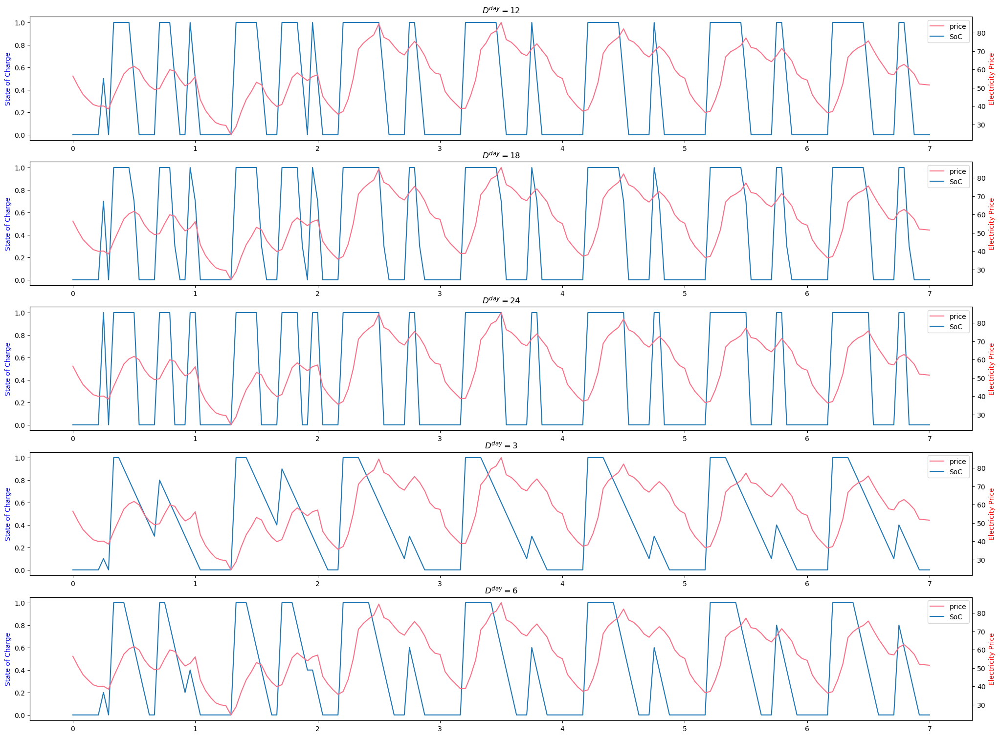

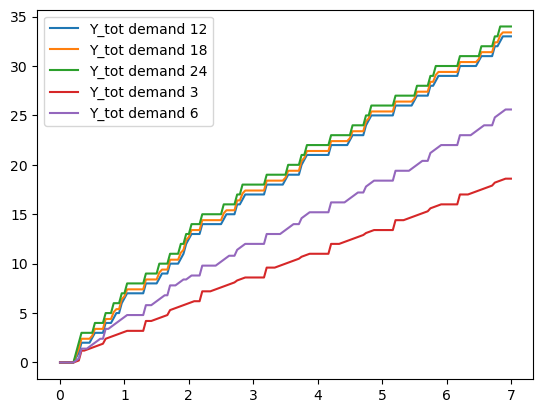

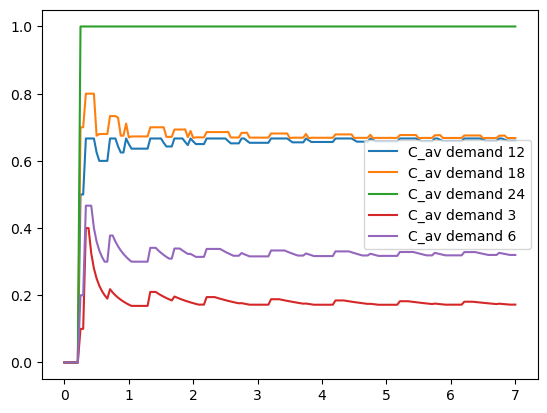

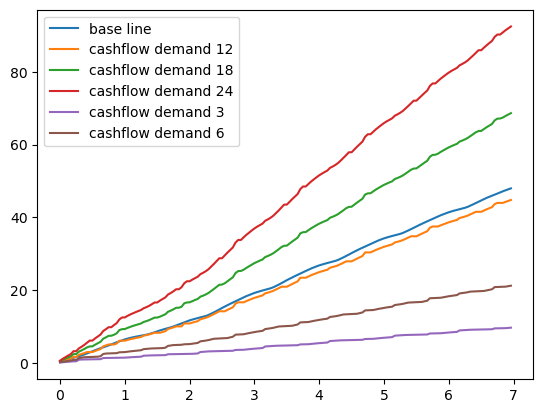

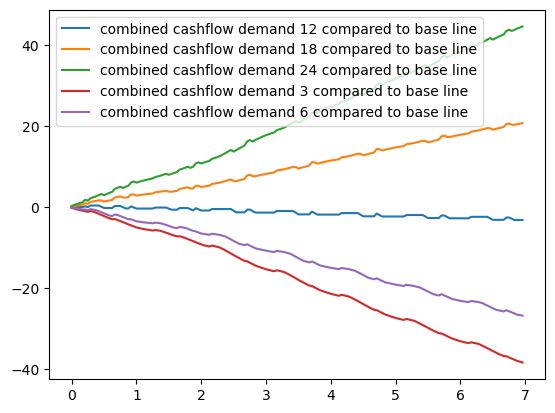

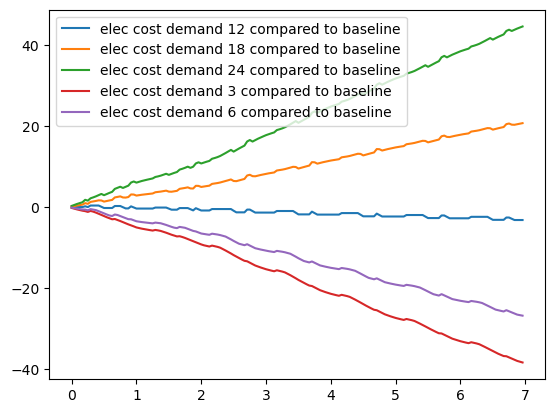

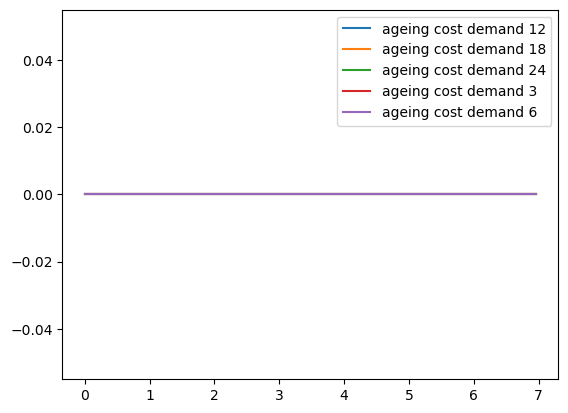

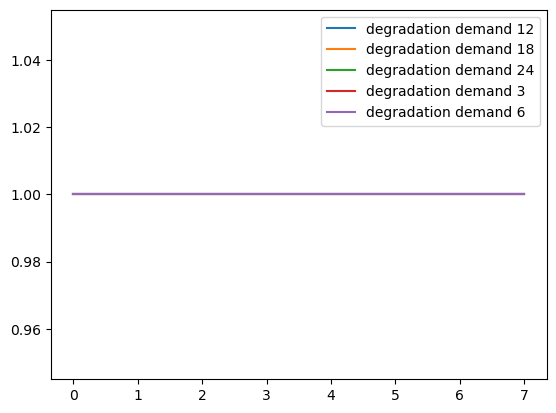

In [11]:
initial_control = (0.0, 0.0, 0.0)  # edit this

title_map = lambda label: f'$D^{{{{day}}}} = {label.split(" ")[1]}$'
visualize.visualize_sample(solvers, initial_control=initial_control, combined=False, only_SoC=True, title_map=title_map)